### Multiple OCR

The notebook contains a comparision among different OCR's available in the
Market


* https://blog.restaurants.club/management/menu-digitale-con-qr-code-come-funziona/#

Open source OCR

*   Pytesseract
*   EasyOCR
*   PaddleOCR
*   KerasOCR


Paid Source OCR
*   AmazonTextract
*   Google Vision OCR




In [ ]:
!pip install PyMuPDF
!pip install gradio
!sudo apt install tesseract-ocr
!pip install pytesseract
!pip install easyocr
!pip install keras-ocr
!pip install paddlepaddle paddleocr
!pip install google-cloud-vision
!pip install langchain
!pip install langchain-groq

### Imports

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import cv2
import pytesseract
import numpy as np
from scipy.ndimage import interpolation as inter
from scipy.ndimage import interpolation as inter
from os import walk
from tabulate import tabulate
from PIL import Image, ImageDraw
from difflib import SequenceMatcher
from tqdm.notebook import tqdm
import os, glob, cv2, re
import fitz
import pytesseract
import numpy as np
import pandas as pd
import json
from scipy import ndimage
import fitz
import cv2
from PIL import Image
import cv2
import cv2
import easyocr
import matplotlib.pyplot as plt
import keras_ocr
from google.colab import userdata
from langchain_groq import ChatGroq
GROQ=userdata.get('GROQ')

### Preprocessing functions

In [ ]:
def removeBorders(img):
  result = img.copy()

  if len(result.shape) == 2:
      # if the input image is grayscale, convert it to BGR format
      result = cv2.cvtColor(result, cv2.COLOR_GRAY2BGR)

  gray = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY) # convert to grayscale
  thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

  # Remove horizontal lines
  horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (40,1))
  remove_horizontal = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, horizontal_kernel, iterations=2)
  cnts = cv2.findContours(remove_horizontal, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts = cnts[0] if len(cnts) == 2 else cnts[1]
  for c in cnts:
      cv2.drawContours(result, [c], -1, (255,255,255), 5)

  # Remove vertical lines
  vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1,40))
  remove_vertical = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, vertical_kernel, iterations=2)
  cnts = cv2.findContours(remove_vertical, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts = cnts[0] if len(cnts) == 2 else cnts[1]
  for c in cnts:
      cv2.drawContours(result, [c], -1, (255,255,255), 5)

  return result


# Methods below could be usable for image preprocessing task. In some cases the quality of images
# are not as well so we need to smooth them and remove noises
BINARY_THREHOLD = 180
def image_smoothening(img):
    ret1, th1 = cv2.threshold(img, BINARY_THREHOLD, 255, cv2.THRESH_BINARY)
    ret2, th2 = cv2.threshold(th1, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    blur = cv2.GaussianBlur(th2, (1, 1), 0)
    ret3, th3 = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return th3

def remove_noise_and_smooth(img):
    filtered = cv2.adaptiveThreshold(img.astype(np.uint8), 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 41,
                                     3)
    kernel = np.ones((1, 1), np.uint8)
    opening = cv2.morphologyEx(filtered, cv2.MORPH_OPEN, kernel)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)
    img = image_smoothening(img)
    or_image = cv2.bitwise_or(img, closing)
    return or_image


def rotate_image(image):
    extracted_text = pytesseract.image_to_string(image)
    # check if the image contains any text
    if not extracted_text:
        print("The image does not contain any text.")
        return None
    elif extracted_text.isspace():
        print("The image contains only spaces.")
        return None
    text = pytesseract.image_to_osd(image)
    angle = int(re.search('(?<=Rotate: )\d+', text).group(0))
    angle = 360 - angle
    rotated = ndimage.rotate(image, angle)
    data = Image.fromarray(rotated)
    return data




# correct the skewness of images
def correct_skew(image, delta=1, limit=5):
    def determine_score(arr, angle):
        data = inter.rotate(arr, angle, reshape=False, order=0)
        histogram = np.sum(data, axis=1, dtype=float)
        score = np.sum((histogram[1:] - histogram[:-1]) ** 2, dtype=float)
        return histogram, score

    # Convert the PIL Image object to a numpy array
    image = np.asarray(image.convert('L'), dtype=np.uint8)

    # Apply thresholding
    thresh = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    scores = []
    angles = np.arange(-limit, limit + delta, delta)
    for angle in angles:
        histogram, score = determine_score(thresh, angle)
        scores.append(score)
    best_angle = angles[scores.index(max(scores))]

    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, best_angle, 1.0)
    corrected = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, \
            borderMode=cv2.BORDER_REPLICATE)
    return best_angle, corrected

# Tesseract

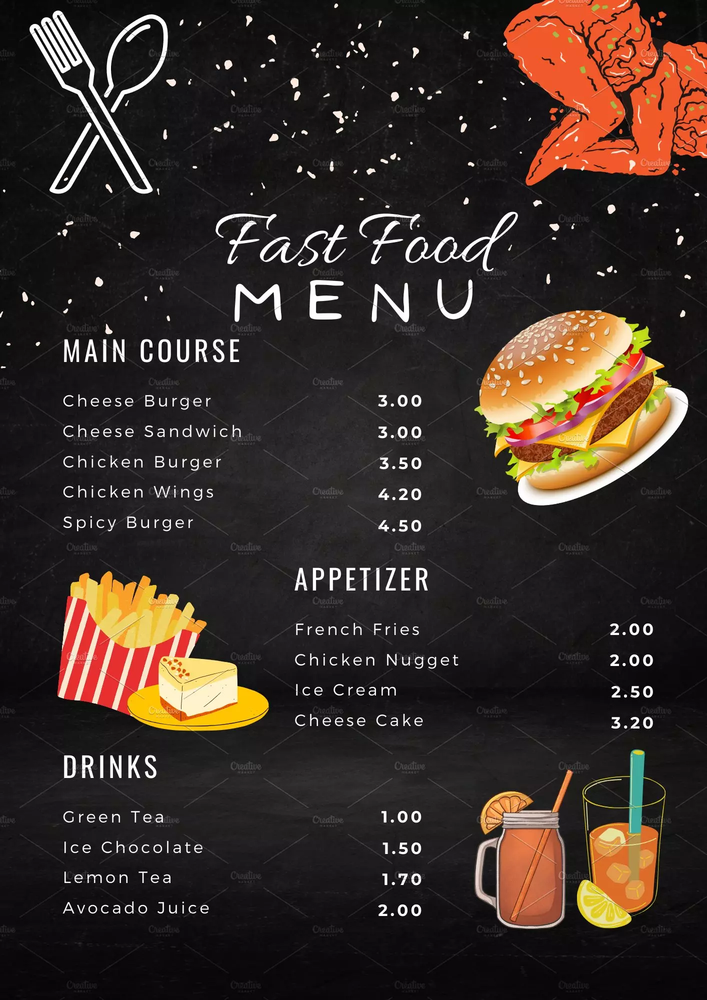

<ipython-input-12-18edf6e7c04b>:73: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  data = inter.rotate(arr, angle, reshape=False, order=0)


In [ ]:
import fitz
import cv2
from PIL import Image
import cv2
from google.colab.patches import cv2_imshow

def completepreprocess(image_path):
    image = cv2.imread(image_path)
    cv2_imshow(image)
    ro_image = rotate_image(image)
    if ro_image is None:
        return None
    angle, skewed_image = correct_skew(ro_image)
    if skewed_image is None:
        return None
    remove_border = removeBorders(skewed_image)
    image = Image.fromarray(remove_border)
    return image



# Example usage:
preprocessed_image = completepreprocess("/content/menu.jpg")


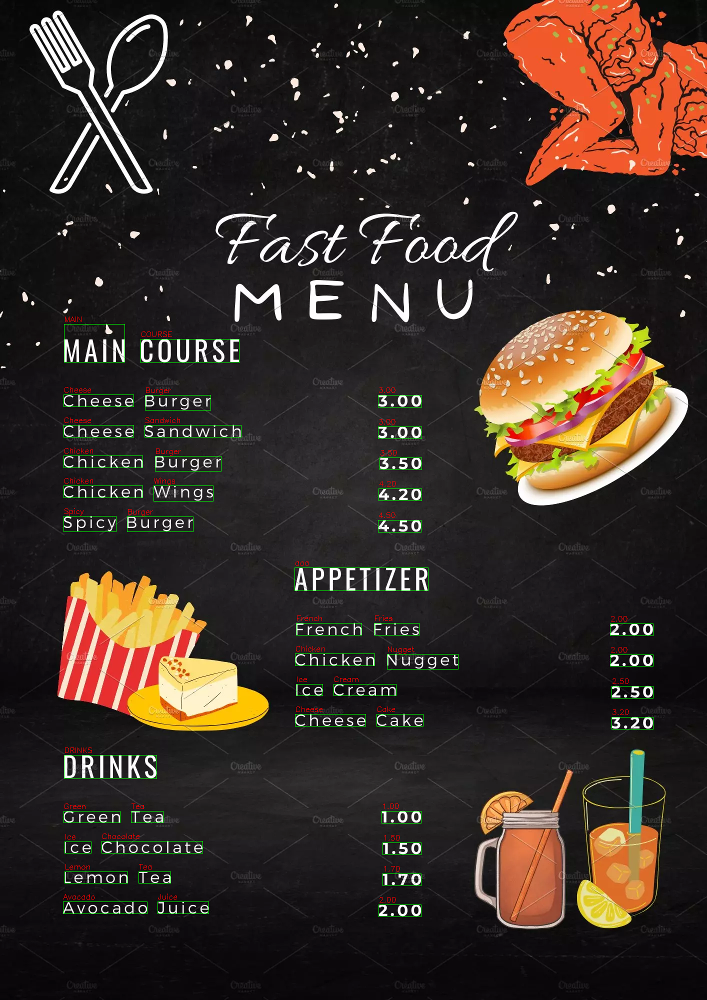

In [ ]:
import cv2
import pytesseract
from google.colab.patches import cv2_imshow

def draw_word_boxes(image_path):
    # Read the image
    image = cv2.imread(image_path)
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Perform OCR using Tesseract
    data = pytesseract.image_to_data(gray_image, output_type=pytesseract.Output.DICT)

    # Iterate over each word
    for i in range(len(data['text'])):
        # Extract coordinates and text
        x, y, w, h = data['left'][i], data['top'][i], data['width'][i], data['height'][i]
        text = data['text'][i]
        # Skip empty text
        if text.strip() == '':
            continue
        # Draw bounding box
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 1)
        # Display text
        cv2.putText(image, text, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

    # Display the image with bounding boxes
    cv2_imshow(image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Example usage:
image_path = "/content/menu.jpg"
draw_word_boxes(image_path)


## Easy OCR

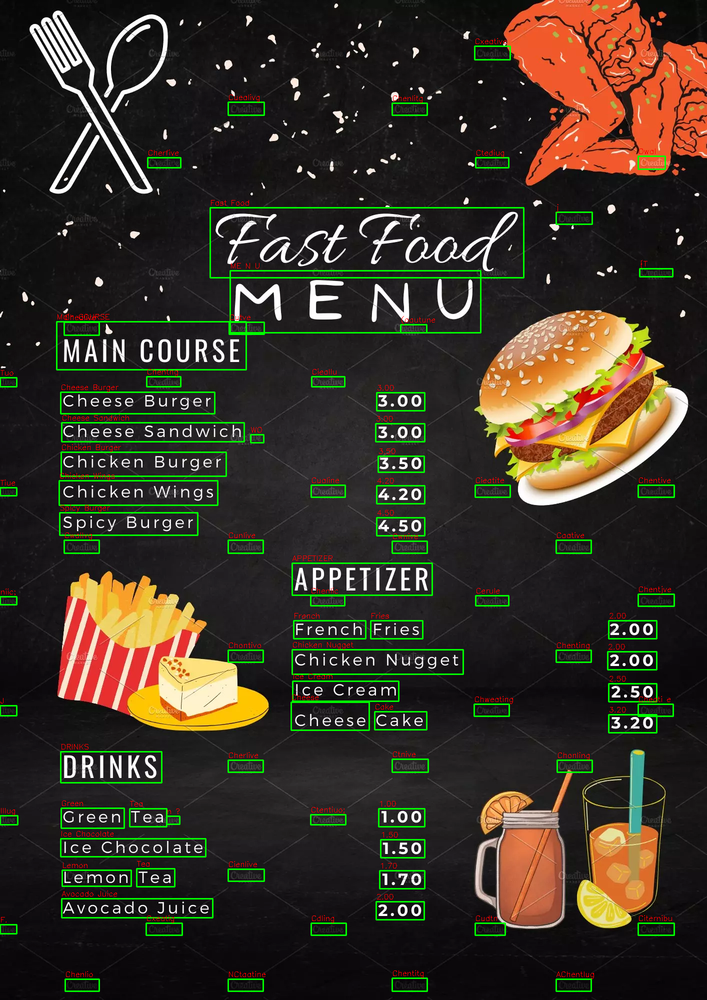

In [ ]:
import cv2
import easyocr
from google.colab.patches import cv2_imshow

# Read the image
image = cv2.imread('/content/menu.jpg')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Perform OCR using EasyOCR
reader = easyocr.Reader(['en'])
result = reader.readtext(gray_image)

# Iterate over each word
for (bbox, text, prob) in result:
    # Extract the bounding box coordinates
    (x_min, y_min), (x_max, y_max) = (int(bbox[0][0]), int(bbox[0][1])), (int(bbox[2][0]), int(bbox[2][1]))

    # Draw the bounding box
    cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)

    # Draw the text
    cv2.putText(image, text, (x_min, y_min - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

# Display the image with text and bounding boxes
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Keras OCR

Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


1/1 [==============================] - 43s 43s/step


4/4 [==============================] - 28s 6s/step


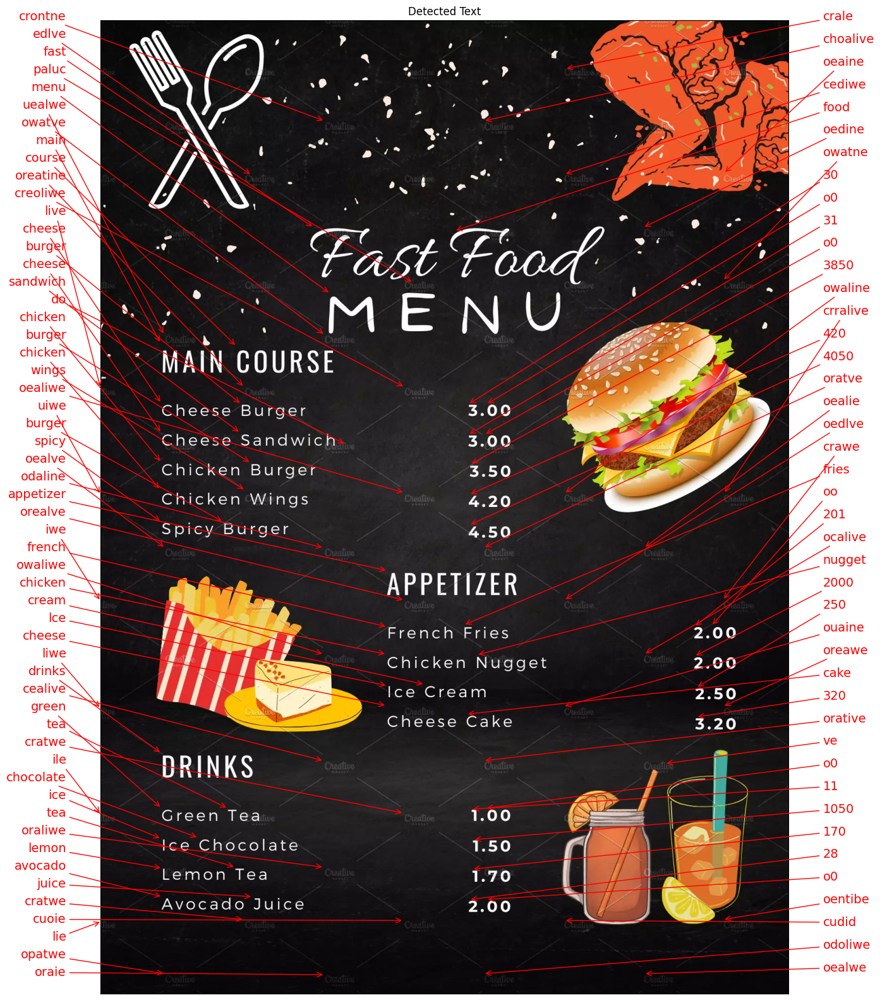

In [ ]:
import matplotlib.pyplot as plt
import keras_ocr

# Initialize the Keras-OCR pipeline
pipeline = keras_ocr.pipeline.Pipeline()

# Load the image
images = [keras_ocr.tools.read('/content/menu.jpg')]

# Perform text detection and recognition
prediction_groups = pipeline.recognize(images)

# Create a figure with a single subplot
fig, ax = plt.subplots(figsize=(20, 20))

# Iterate over the predictions and draw the bounding boxes and text
for image, predictions in zip(images, prediction_groups):
    # Draw the bounding boxes and text on the image
    keras_ocr.tools.drawAnnotations(image=image, predictions=predictions, ax=ax)

# Set the title for the subplot
ax.set_title('Detected Text')

# Display the image
ax.imshow(images[0])

# Show the figure
plt.show()

# paddle OCR

[2024/04/18 18:14:44] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_char_dict_path='

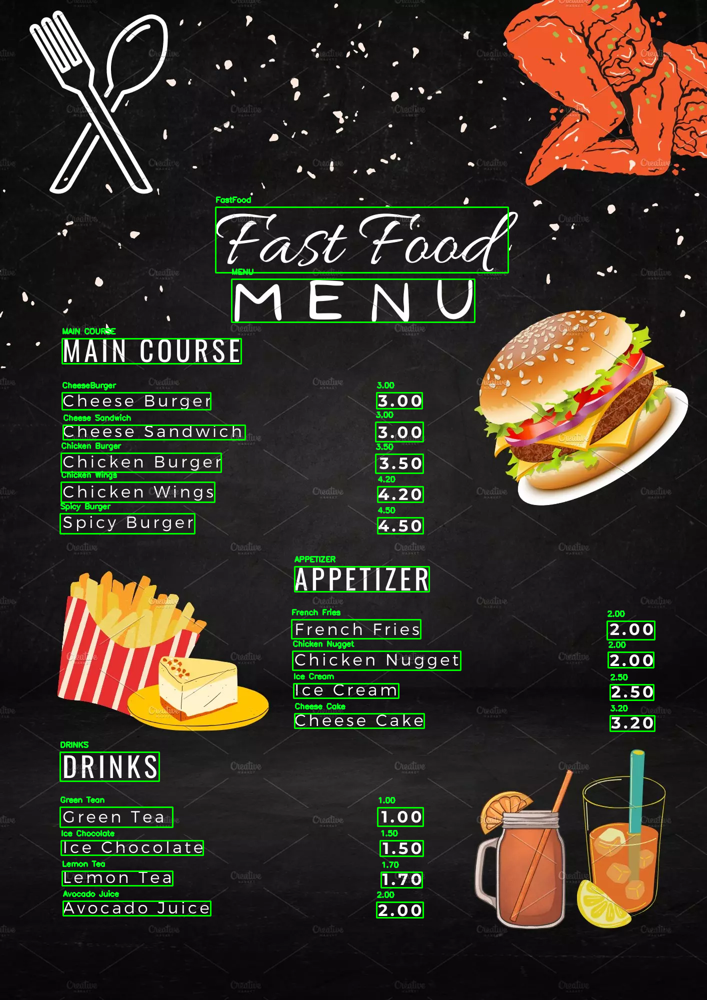

In [7]:
from paddleocr import PaddleOCR
from google.colab.patches import cv2_imshow
import cv2

# Initialize the Paddle OCR model
ocr = PaddleOCR(lang='en')

# Load the image
image_path = '/content/menu.jpg'
image = cv2.imread(image_path)

# Perform OCR on the image
result = ocr.ocr(image_path)

# Draw bounding boxes around the detected text
for line in result:
    for box, text_tuple in line:
        # Extract the recognized text
        text = text_tuple[0]

        # Extract the individual coordinates from the list
        x1, y1, x2, y2 = int(box[0][0]), int(box[0][1]), int(box[2][0]), int(box[2][1])

        # Draw the bounding box on the image
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Draw the text on the image
        cv2.putText(image, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (36, 255, 12), 2)

# Display the image with the bounding boxes
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Amazon Textract

# Google Vision OCR

In [ ]:
!pip install google-cloud-vision

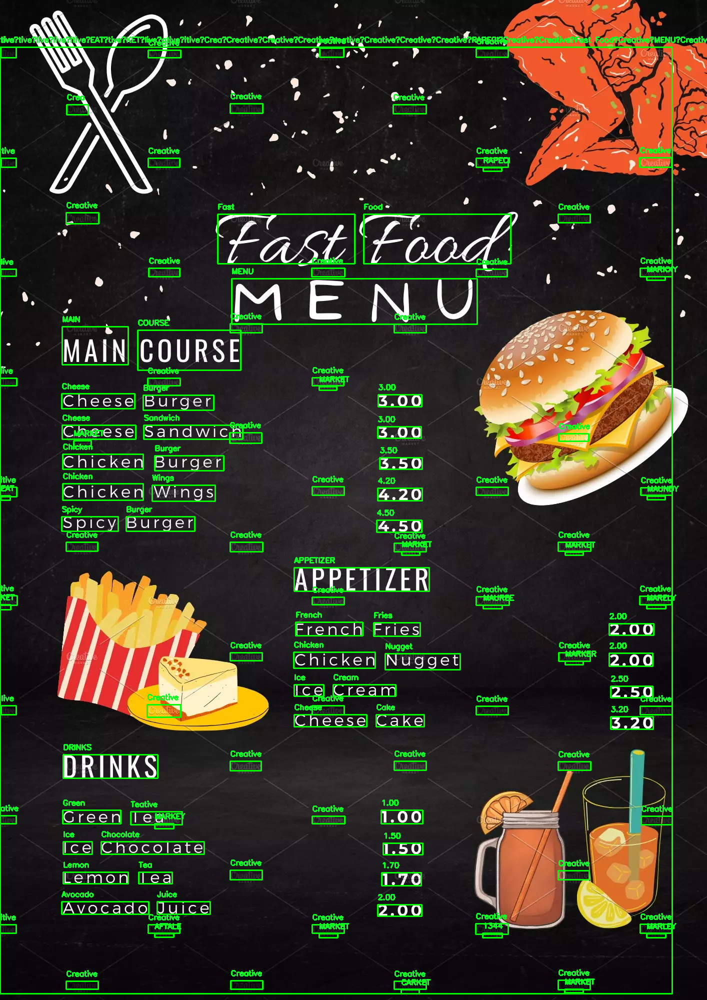

In [3]:
from google.cloud import vision_v1p3beta1 as vision
from google.cloud import vision_v1p3beta1 as vision
from google.cloud import vision
from google.colab.patches import cv2_imshow
import os
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = ""


from google.cloud import vision
import cv2
import numpy as np

# Set up the Google Cloud Vision API client
client = vision.ImageAnnotatorClient()

# Load the image
image_path = '/content/menu.jpg'
image = cv2.imread(image_path)

# Create a Google Vision API image object
with open(image_path, 'rb') as image_file:
    content = image_file.read()
image_object = vision.Image(content=content)

# Detect text in the image
response = client.text_detection(image=image_object)
texts = response.text_annotations

# Draw bounding boxes around the detected text
for text in texts:
    vertices = [(vertex.x, vertex.y) for vertex in text.bounding_poly.vertices]
    x, y, w, h = cv2.boundingRect(np.array([vertices], np.int32))
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.putText(image, text.description, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (36, 255, 12), 2)

# Display the image with the bounding boxes
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
# Extract the text
detected_text = [text.description for text in texts]

# Print the detected text
for text in detected_text:
    print(text)

## LLM TO PREDICT THE MENU

In [8]:
llm = ChatGroq(temperature=0.1,
               groq_api_key=GROQ,
               model_name="mixtral-8x7b-32768",
               max_tokens=32000)

In [9]:
prompt=f"""
Write a prompt to extract and the Menu Dish and it's prices in a structured JSON
{title}
"""